<a href="https://colab.research.google.com/github/athorared/animal-recognising-model/blob/main/animal_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# imports
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import os
import time
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torch.optim as optim

In [2]:
# Install dependencies
pip install torch torchvision matplotlib

In [3]:
# Upload dataset folder from kaggle using API file
!pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"athora","key":"ff664bea01a4c60d4ec4dcdaff066075"}'}

In [4]:
# Set up kaggle credentials
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
# Download dataset from kaggle
!kaggle datasets download -d alessiocorrado99/animals10

Dataset URL: https://www.kaggle.com/datasets/alessiocorrado99/animals10
License(s): GPL-2.0
 98% 576M/586M [00:03<00:00, 109MB/s] 
100% 586M/586M [00:03<00:00, 184MB/s]


In [6]:
!unzip animals10.zip -d animals10


Streaming output truncated to the last 5000 lines.
  inflating: animals10/raw-img/ragno/OIP-MVQChNQpHiMZEVMPehrvoAHaE6.jpeg  
  inflating: animals10/raw-img/ragno/OIP-MVdIFDAFpNyK_XCpwkDIWgHaFj.jpeg  
  inflating: animals10/raw-img/ragno/OIP-MYY_8k5AHqMJwTCNXfH6rwHaFj.jpeg  
  inflating: animals10/raw-img/ragno/OIP-MZEVXuoMsATG8u_UuTQ6hAHaE8.jpeg  
  inflating: animals10/raw-img/ragno/OIP-MZg0tznDRE95AMfyuutuYAHaE6.jpeg  
  inflating: animals10/raw-img/ragno/OIP-M_r9DkR2X5gP0P5-z8wPYQHaE7.jpeg  
  inflating: animals10/raw-img/ragno/OIP-M_xDUSzjlF3-w9XHCm93cgHaFF.jpeg  
  inflating: animals10/raw-img/ragno/OIP-MbI4-bMyutRX3X382IAVcQAAAA.jpeg  
  inflating: animals10/raw-img/ragno/OIP-MbMksZdD7gomsC9fd6cpKgHaHJ.jpeg  
  inflating: animals10/raw-img/ragno/OIP-Md4AMcvjaHcivJqeW06wEwHaFW.jpeg  
  inflating: animals10/raw-img/ragno/OIP-MgCgailkT5XkO1XczzQCngHaLK.jpeg  
  inflating: animals10/raw-img/ragno/OIP-MgrKq05YHGXsgj1AmYIyJQHaE8.jpeg  
  inflating: animals10/raw-img/ragno/OIP-MhRGx7d8

In [7]:
import os
print(os.getcwd())


/content


In [8]:
!ls animals10/raw-img/

cane	 elefante  gallina  mucca   ragno
cavallo  farfalla  gatto    pecora  scoiattolo


In [9]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# resize, convert to tensor, normalize pixel rgb values
# implement data augmentation on dataset to prevent overfitting
transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# load the dataset
dataset = datasets.ImageFolder('animals10/raw-img', transform=transform)


In [10]:
# Check class counts for balance
from collections import Counter
targets = dataset.targets
class_counts = Counter(targets)
print("Class counts:", class_counts)

Class counts: Counter({0: 4863, 8: 4821, 4: 3098, 1: 2623, 3: 2112, 6: 1866, 9: 1862, 7: 1820, 5: 1668, 2: 1446})


In [11]:
# split into train/test
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

from torch.utils.data import WeightedRandomSampler

# Creating sampler
# Get the original indices corresponding to the training dataset
train_indices = train_dataset.indices

# Get the labels for the training dataset using the original dataset and the training indices
train_labels = [dataset.targets[i] for i in train_indices]

# Recalculate class counts and weights specifically for the training dataset
train_class_counts = Counter(train_labels)
num_train_samples = len(train_dataset)
train_class_weights = {cls: num_train_samples / count for cls, count in train_class_counts.items()}
train_sample_weights = [train_class_weights[label] for label in train_labels]
train_sample_weights = torch.DoubleTensor(train_sample_weights)

# Create the sampler using the weights and number of samples from the training dataset
sampler = WeightedRandomSampler(
    weights=train_sample_weights,
    num_samples=len(train_sample_weights),  # draw as many samples as training dataset size
    replacement=True                  # allows oversampling minority classes
)

# Create data loaders for training and testing datasets
# shuffle=False as sampler is being used
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False, sampler = sampler)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [15]:
# defining the CNN model

model = models.resnet18(pretrained=True)

# Replace the final classification layer for 10 classes
model.fc = nn.Linear(model.fc.in_features, 10)

# Move to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 185MB/s]


In [17]:
from torch.optim.lr_scheduler import StepLR

# Define loss function
criterion = nn.CrossEntropyLoss()

# Pass the parameters of the model instance to the optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Define a learning rate scheduler
# StepLR decreases the learning rate by a factor of gamma every step_size epochs
scheduler = StepLR(optimizer, step_size=5, gamma=0.1)

In [21]:
# Training the model

device = torch.device("mps" if torch.backends.mps.is_available() else ("cuda" if torch.cuda.is_available() else "cpu"))
model.to(device)

num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    start_time = time.time() # Start time for the epoch

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    end_time = time.time() # End time for the epoch
    epoch_time = end_time - start_time

    # Step the scheduler at the end of each epoch
    scheduler.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}, Time: {epoch_time:.2f} seconds")

Epoch [1/10], Loss: 0.4352, Time: 173.89 seconds
Epoch [2/10], Loss: 0.3634, Time: 173.68 seconds
Epoch [3/10], Loss: 0.3162, Time: 177.35 seconds
Epoch [4/10], Loss: 0.2784, Time: 173.68 seconds
Epoch [5/10], Loss: 0.2437, Time: 172.92 seconds
Epoch [6/10], Loss: 0.1381, Time: 177.49 seconds
Epoch [7/10], Loss: 0.0978, Time: 177.32 seconds
Epoch [8/10], Loss: 0.0765, Time: 175.52 seconds
Epoch [9/10], Loss: 0.0646, Time: 174.61 seconds
Epoch [10/10], Loss: 0.0614, Time: 177.73 seconds


In [23]:
# Evaluate the model
model.eval()  # Set the model to evaluation mode
correct = 0
total = 0
all_predicted = []
all_labels = []

with torch.no_grad():  # Disable gradient calculation during evaluation
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        all_predicted.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

print(f'Accuracy of the model on the {total} test images: {100 * correct / total:.2f}%')

from sklearn.metrics import precision_score, recall_score, f1_score

# Calculate Precision, Recall, and F1-score
precision = precision_score(all_labels, all_predicted, average='macro')
recall = recall_score(all_labels, all_predicted, average='macro')
f1 = f1_score(all_labels, all_predicted, average='macro')

print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1-score: {f1:.4f}')

Accuracy of the model on the 5236 test images: 94.44%
Precision: 0.9396
Recall: 0.9425
F1-score: 0.9406


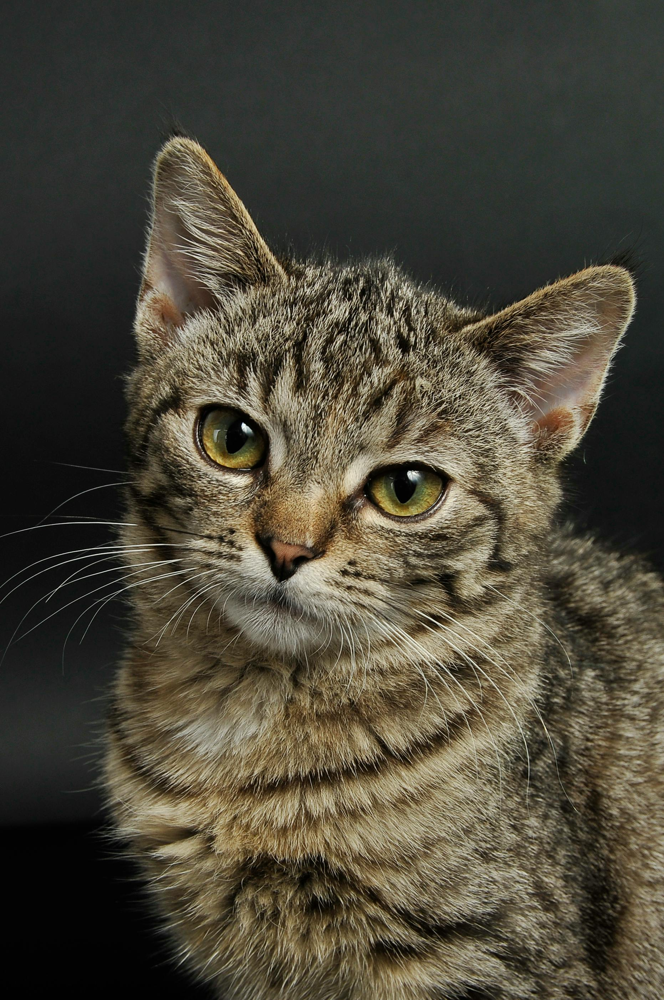

In [46]:
# Testing the model with a custom image
from PIL import Image
# Define the same transformations used for training
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Load your image (replace 'your_image.jpg' with the actual filename)
# You can upload your image to the Colab environment using the file browser on the left.
try:
    image_path = 'cat.jpeg' # <--- Change this to your image file name
    image = Image.open(image_path).convert('RGB') # Ensure image is in RGB format
    display(image)
except FileNotFoundError:
    print(f"Error: The file '{image_path}' was not found. Please upload your image and make sure the filename is correct.")

In [47]:
# Model output for custom image
# Preprocess the image and add a batch dimension
if 'image' in locals():
    input_tensor = transform(image)
    input_batch = input_tensor.unsqueeze(0)  # Add a batch dimension

    # Define the device again to ensure it's available in this cell
    device = torch.device("mps" if torch.backends.mps.is_available() else ("cuda" if torch.cuda.is_available() else "cpu"))

    # Move the input to the same device as the model
    input_batch = input_batch.to(device)

    # Get the model's prediction
    model.eval() # Set the model to evaluation mode
    with torch.no_grad():
        output = model(input_batch)

    # Get the predicted class index
    _, predicted_class_index = torch.max(output, 1)

    # Get the class name
    # The dataset.classes attribute holds the list of class names in the order of their indices
    predicted_class_name = dataset.classes[predicted_class_index.item()]

    translate = {"cane": "dog", "cavallo": "horse", "elefante": "elephant", "farfalla": "butterfly", "gallina": "chicken", "gatto": "cat", "mucca": "cow", "pecora": "sheep", "ragno": "spider", "scoiattolo": "squirrel"} # Corrected 'ragno' translation

    if predicted_class_name in translate:
        predicted_class_name_en = translate[predicted_class_name]
        # Move print statement inside the if block
        print(f"The model predicts this image is a: {predicted_class_name_en}")
    else:
        # Handle cases where the class name is not in the translate dictionary
        print(f"The model predicts this image is a: {predicted_class_name} (Translation not available)")

else:
    print("Image was not loaded successfully. Please check the previous cell.")

The model predicts this image is a: cat
